In [1]:
pip install geopandas

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 29.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 72.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.1/16.1 MB 76.0 MB/s eta 0:00:00


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import requests
import geopandas as gpd

In [3]:
a = gpd.read_file('/content/GeoJSON - Temperatura máxima.json')
a.head(3)

,id,gid,tmax_rango,area_km,geometry
0,inegi_conttempma_1998.1,1,de 12° a 16° C,113.803254,"MULTIPOLYGON (((-99.81632 19.19512, -99.80998 ..."
1,inegi_conttempma_1998.2,2,de 12° a 16° C,45.923425,"MULTIPOLYGON (((-97.13269 19.53794, -97.12884 ..."
2,inegi_conttempma_1998.3,3,de 12° a 16° C,45.473076,"MULTIPOLYGON (((-98.02900 19.27507, -98.02270 ..."


In [4]:
a["area_km"] = a.area
a["area_km"]

<ipython-input-4-572b35fc21f0>:1: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  a["area_km"] = a.area


0      0.009822
1      0.003976
2      0.003928
3      0.016685
4      0.010178
         ...   
714    0.000436
715    0.000227
716    0.000099
717    0.000008
718    0.000237
Name: area_km, Length: 719, dtype: float64

<Axes: >

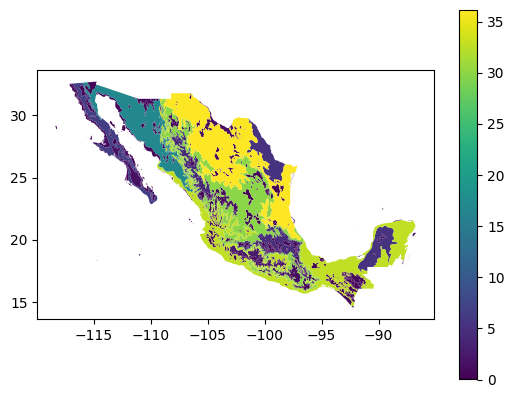

In [5]:
a.plot("area_km", legend = True)

<Axes: >

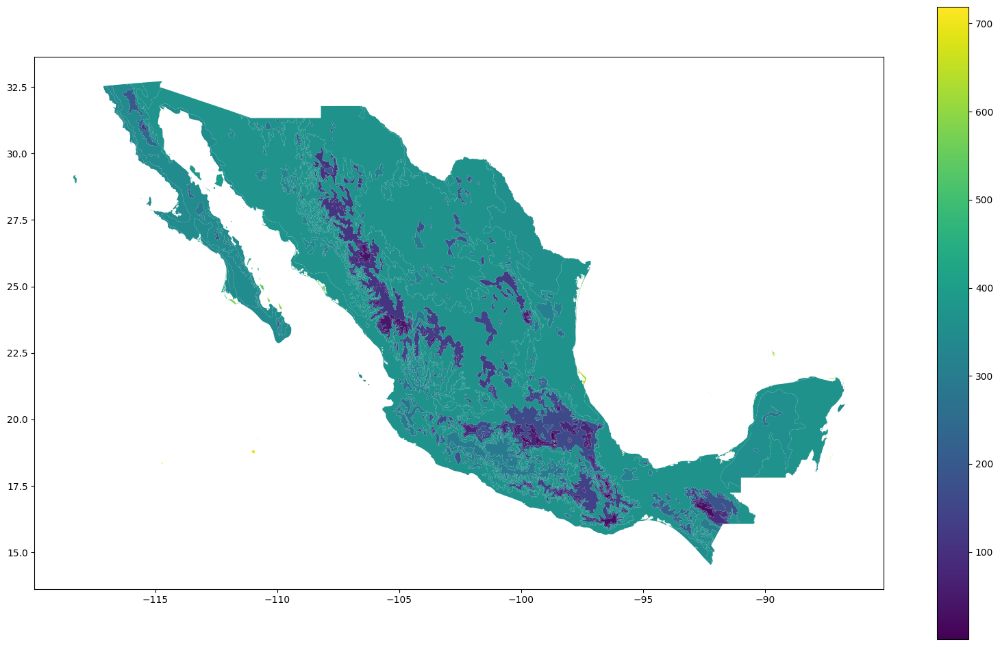

In [6]:
a.plot(column = "gid", legend = True, figsize = (20, 12))

In [7]:
repo_url = 'https://www.gits.igg.unam.mx/repositoriodecapas/geojson/inegi_conttempma_1998.json' #Archivo GeoJSON
mx_regions_geo = requests.get(repo_url).json()

In [8]:
import plotly.express as px
fig = px.choropleth(
    a,
    geojson=mx_regions_geo,
    locations="gid",
    featureidkey="properties.ID_3",
    color="gid", #area_km
    color_continuous_scale="deep",
    range_color=(0, 12),
    # scope="europe",
    labels={"unemp": "unemployment rate"},
)
#fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0})
#fig.update_geos(fitbounds="locations", visible=True)
#fig.show()

fig.update_geos(showcountries=True, showcoastlines=True, showland=True, fitbounds="locations")
fig.show()

In [9]:
df = gpd.read_file('/content/GeoJSON - Régimenes de humedad del suelo.json')
df.head(3)

,id,gid,index,clave_rh,descripcio,area_km2,geometry
0,inegi_refhumesue_1992.1,1,1,1,Arídico con 0 días de humedad,191941.013754,"MULTIPOLYGON (((-116.00046 32.65461, -114.7573..."
1,inegi_refhumesue_1992.2,2,2,2,Arídico con menos de 90 días de humedad,9189.559923,"MULTIPOLYGON (((-116.14294 32.64462, -116.0004..."
2,inegi_refhumesue_1992.3,3,3,3,Xérico con 90 a 180 días de humedad,17253.579446,"MULTIPOLYGON (((-116.91688 32.58761, -116.7666..."


<Axes: >

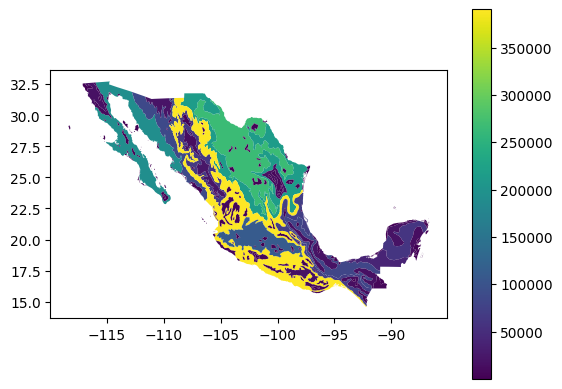

In [10]:
df.plot("area_km2", legend = True)

In [11]:
repo_url = 'https://www.gits.igg.unam.mx/repositoriodecapas/geojson/inegi_refhumesue_1992.json' #Archivo GeoJSON
mx_regions_geo = requests.get(repo_url).json()

In [12]:
import plotly.express as px
fig = px.choropleth(
    df,
    geojson=mx_regions_geo,
    locations="gid",
    featureidkey="properties.ID_3",
    color="area_km2", #area_km
    color_continuous_scale="electric",
    range_color=(0, 12),
    # scope="europe",
    labels={"unemp": "unemployment rate"},
)
#fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0})
#fig.update_geos(fitbounds="locations", visible=True)
#fig.show()

fig.update_geos(showcountries=True, showcoastlines=True, showland=True, fitbounds="locations")
fig.show()

In [19]:
import folium
import json
import random

# Create a map centered on a location
m = folium.Map(location=[51.5074, -0.1278], zoom_start=10)

# Create a GeoJSON feature collection
feature_collection = {"type": "FeatureCollection", "features": []}

# Add features to the feature collection with random colors
for i in range(10):
    color = "#{:06x}".format(random.randint(0, 0xFFFFFF))
    feature = {"type": "Feature",
               "geometry": {
                   "type": "Point",
                   "coordinates": [random.uniform(-0.2, 0.2) + -0.1278, random.uniform(-0.2, 0.2) + 51.5074]},
               "properties": {"color": color}}
    feature_collection["features"].append(feature)

# Save the GeoJSON file
with open('features.geojson', 'w') as f:
    json.dump(feature_collection, f)

# Add the GeoJSON layer to the map
folium.GeoJson('features.geojson',
               style_function=lambda feature: {
                   'color': feature['properties']['color'],
                   'weight': 2,
                   'fillOpacity': 0.5
               }).add_to(m)

# Display the map
m


In [32]:
import folium
import json
import random

df = gpd.read_file('/content/GeoJSON - Régimenes de humedad del suelo.json')

# Create a map centered on a location
m = folium.Map(df=['area_km2'], zoom_start=100)

# Create a GeoJSON feature collection
feature_collection = {"type": "FeatureCollection", "features": []}

# Add the GeoJSON layer to the map
folium.GeoJson(df,
               style_function=lambda feature: {
                   'color': 'spectral',
                   'weight': 2,
                   'fillOpacity': 0.5
               }).add_to(m)

# Display the map
m